In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
grayImage = r'albert-einstein_gray.jpg'
colourImage = r'tulips.jpg'

In [3]:
I_gray = cv2.imread(grayImage,cv2.IMREAD_GRAYSCALE)
I_BGR = cv2.imread(colourImage)

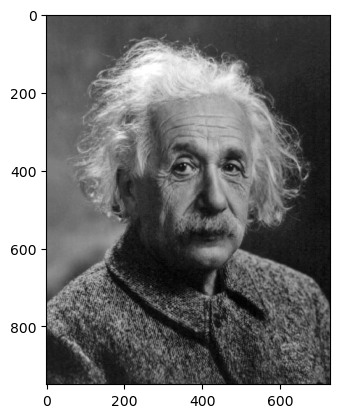

In [4]:
plt.imshow(I_gray,cmap='gray')

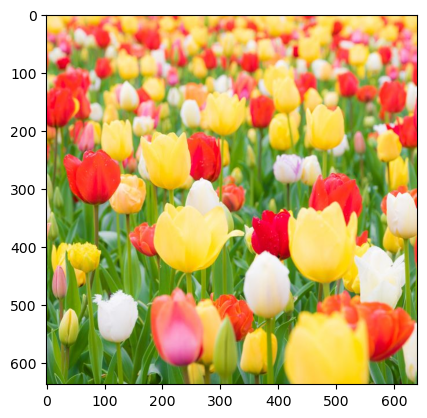

In [5]:
plt.imshow(I_BGR[:,:,::-1])

In [6]:
I_gray_resized = cv2.resize(src=I_gray,fx=2,fy=2,dsize=None)

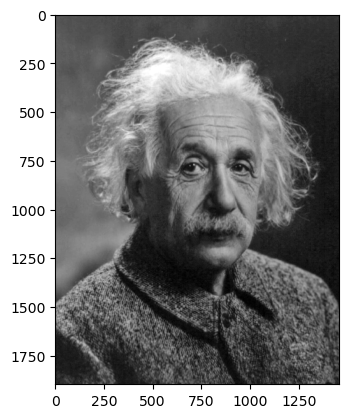

In [7]:
plt.imshow(I_gray_resized,cmap='gray')
# plt.xticks([])
# plt.yticks([])

In [8]:
I_gray_resized.shape

(1898, 1456)

In [9]:
I_gray.shape

(949, 728)

In [10]:
I_BGR_resized = cv2.resize(src=I_BGR,fx=0.5,fy=2,dsize=None)

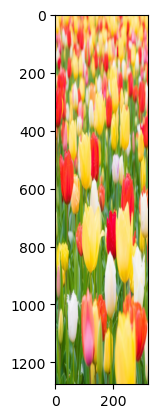

In [11]:
plt.imshow(I_BGR_resized[:,:,::-1])

In [12]:
P = np.array([2,4,6])

In [13]:
Sx,Sy,Sz = 3,0.5,2

In [14]:
S = np.array([[Sx,0,0],[0,Sy,0],[0,0,Sz]])

In [15]:
S

array([[3. , 0. , 0. ],
       [0. , 0.5, 0. ],
       [0. , 0. , 2. ]])

In [16]:
P_dash = S.dot(P)

In [17]:
P_dash

array([ 6.,  2., 12.])

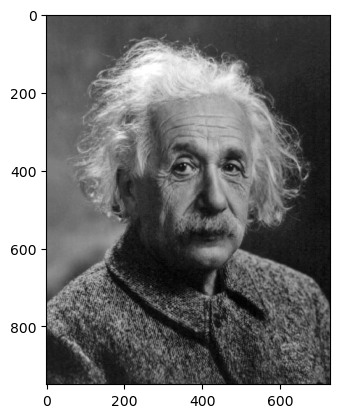

In [18]:
plt.imshow(I_gray,cmap='gray')

In [19]:
numRows = I_gray.shape[0]
numCols = I_gray.shape[1]

In [20]:
print(numRows,numCols)

949 728


In [21]:
I_gray2 = np.zeros((numRows,numCols),dtype='uint8')

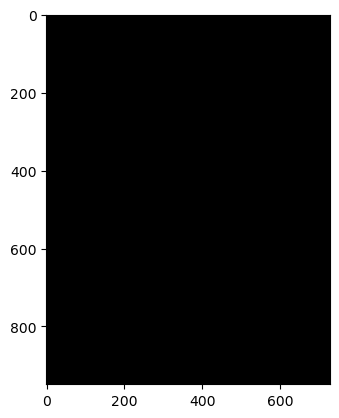

In [22]:
plt.imshow(I_gray2,cmap='gray')

In [23]:
for i in range(numRows):
    for j in range(numCols):
        I_gray2[i,j] = I_gray[i,j]

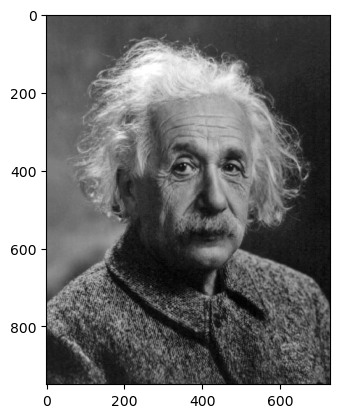

In [24]:
plt.imshow(I_gray2,cmap='gray')

In [25]:
for i in range(numRows):
    for j in range(numCols):
        I_gray2[numRows-i-1,j] = I_gray[i,j]

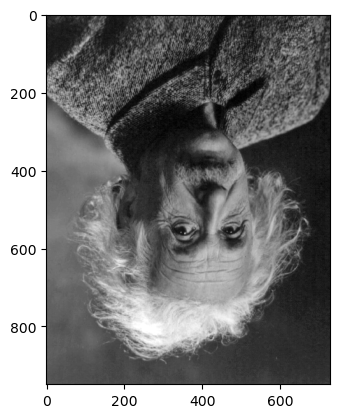

In [26]:
plt.imshow(I_gray2,cmap='gray')

In [27]:
S = np.array([[2,0],[0,2]])

In [28]:
I2 = np.ones((2*numRows,2*numCols),dtype='uint8')*255
I2

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [29]:
for i in range(numRows):
    for j in range(numCols):
        P = np.array([i,j])
        P_dash = S.dot(P)
        new_i , new_j = P_dash[0] , P_dash[1]
        I2[new_i,new_j] = I_gray[i,j]

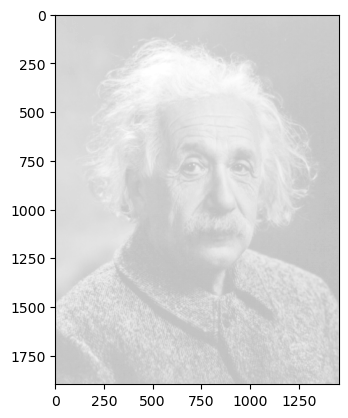

In [30]:
plt.imshow(I2,cmap='gray')

In [31]:
print(I2.shape)

(1898, 1456)


In [32]:
import matplotlib as mpl
def displayImageInActualSize(I):
    dpi = mpl.rcParams['figure.dpi']
    H,W = I.shape
    figSize = W/float(dpi) , H/float(dpi)
    fig = plt.figure(figsize = figSize)
    ax = fig.add_axes([0,0,1,1])
    ax.axis('off')
    ax.imshow(I,cmap='gray')
    plt.show
    

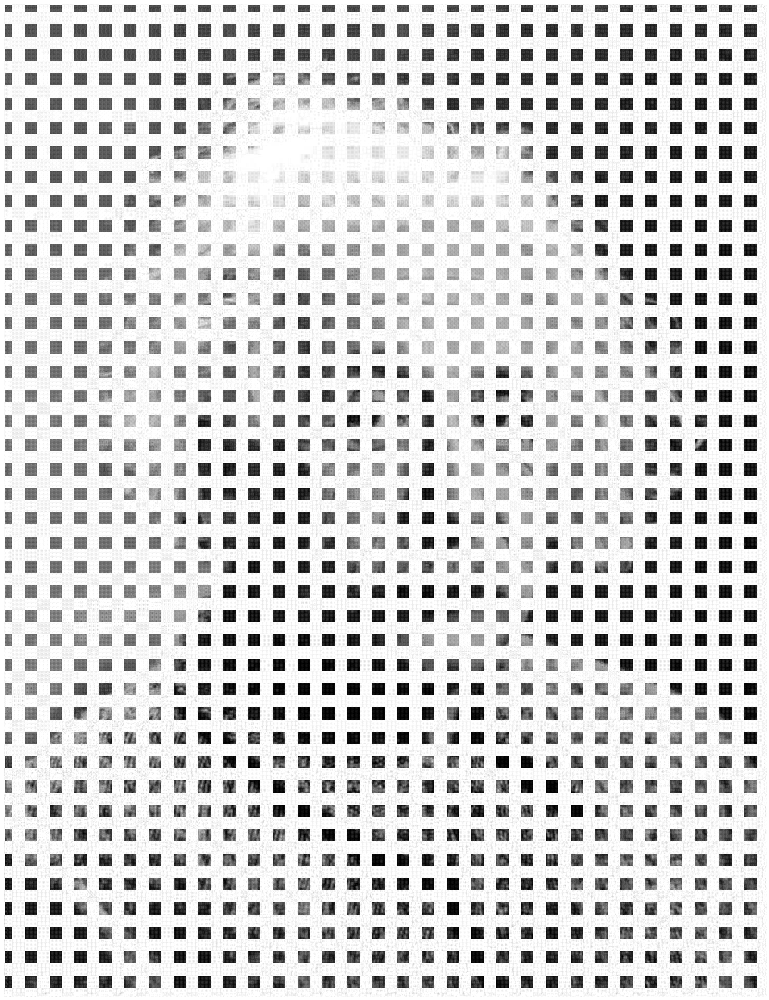

In [33]:
displayImageInActualSize(I2)

In [34]:
S = np.array([[2,0],[0,2]])
I2 = np.zeros((2*numRows,2*numCols),dtype='uint8')
Tinv = np.linalg.inv(S)
for new_i in range(I2.shape[0]):
    for new_j in range(I2.shape[1]):
        P_dash = np.array([new_i,new_j])
        P = Tinv.dot(P_dash)
        P = np.int16(np.round(P))
        i , j = P[0] , P[1]
        if i < 0 or i>=numRows or j<0 or j>=numCols:
            pass
        else:
            I2[new_i,new_j] = I_gray[i,j]

In [35]:
np.ceil(2.3)

3.0

In [36]:
np.floor(2.3)

2.0

In [37]:
np.round(2.1)

2.0

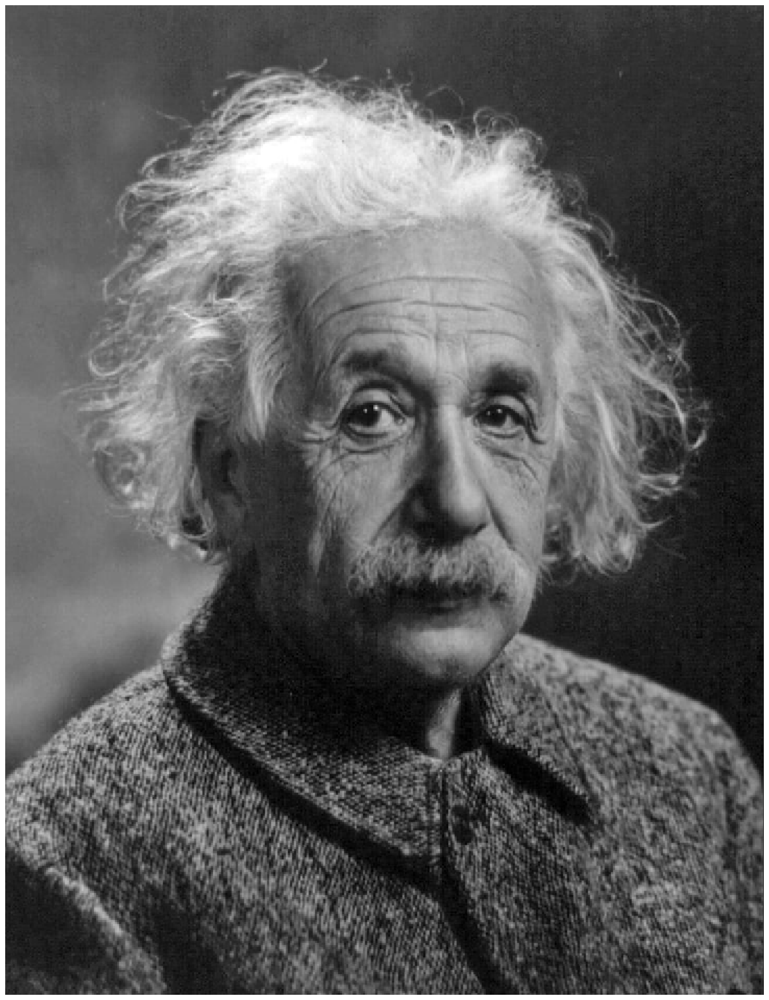

In [38]:
displayImageInActualSize(I2)

In [39]:
Tinv = np.linalg.inv(S)

In [40]:
Tinv

array([[0.5, 0. ],
       [0. , 0.5]])

In [41]:
def f_bilinearInterpolate(r,c,I):
    lc = int(c)
    rc = lc+1
    wr = c - lc
    wl = rc - c
    tr = int(r)
    br = tr+1
    wt = br-r
    wb = r-tr
    if tr >= 0 and br < I.shape[0] and lc >=0 and rc < I.shape[1]:
        a = wl*I[tr,lc] + wr*I[tr,rc]
        b = wl*I[br,lc] + wr*I[br,rc]
        g = wt*a + wb*b
        return np.uint8(g)
    else:
        return 0
        
        

In [42]:
S = np.array([[2,0],[0,2]])
I2 = np.zeros((2*numRows,2*numCols),dtype='uint8')
Tinv = np.linalg.inv(S)
for new_i in range(I2.shape[0]):
    for new_j in range(I2.shape[1]):
        P_dash = np.array([new_i,new_j])
        P = Tinv.dot(P_dash)
        #P = np.int16(np.round(P))
        i , j = P[0] , P[1]
        if i < 0 or i>=numRows or j<0 or j>=numCols:
            pass
        else:
            g = f_bilinearInterpolate(i,j,I_gray)
            I2[new_i,new_j] = g

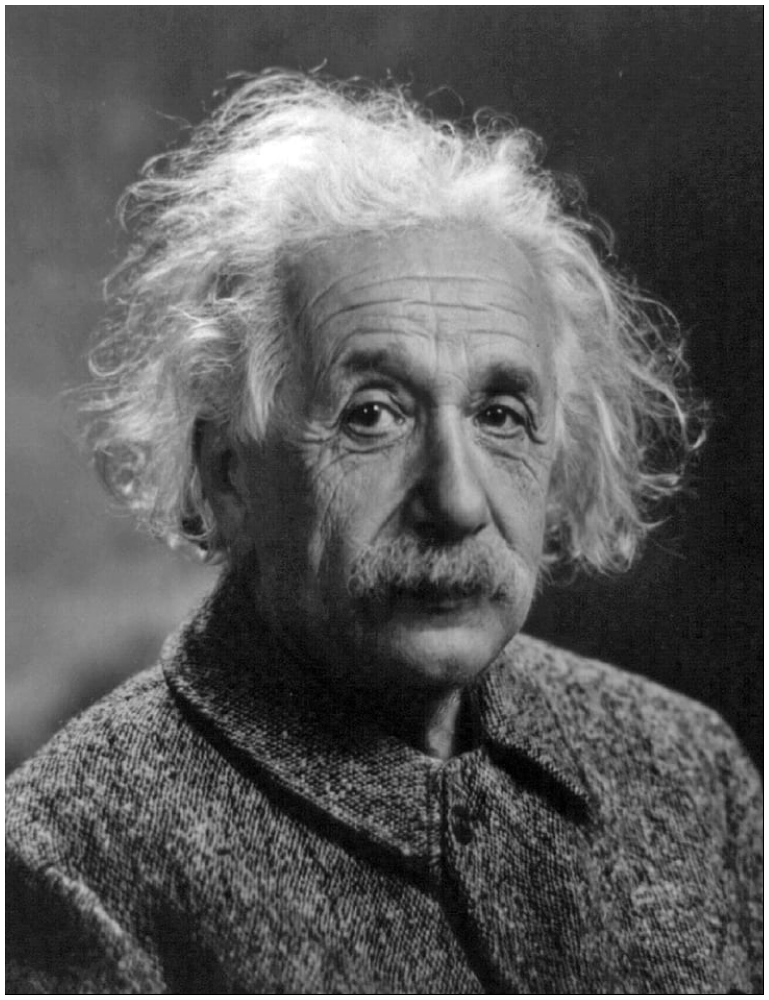

In [43]:
displayImageInActualSize(I2)

In [44]:
def get_scaling_matrix(scale):
    size = len(scale)
    matrix = np.zeros((size,size))
    for i,_ in enumerate(matrix):
        matrix[i][i] = scale[i]
    return matrix
    
def f_scaleImage(scale,I_gray):
    numRows = I_gray.shape[0]
    numCols = I_gray.shape[1]
    S = get_scaling_matrix(scale)
    print(S)
    I2 = np.zeros((int(scale[0])*numRows,int(scale[1])*numCols),dtype='uint8')
    Tinv = np.linalg.inv(S)
    for new_i in range(I2.shape[0]):
        for new_j in range(I2.shape[1]):
            P_dash = np.array([new_i,new_j])
            P = Tinv.dot(P_dash)
            #P = np.int16(np.round(P))
            i , j = P[0] , P[1]
            if i < 0 or i>=numRows or j<0 or j>=numCols:
                pass
            else:
                g = f_bilinearInterpolate(i,j,I_gray)
                I2[new_i,new_j] = g
    return I2

[[2. 0.]
 [0. 2.]]


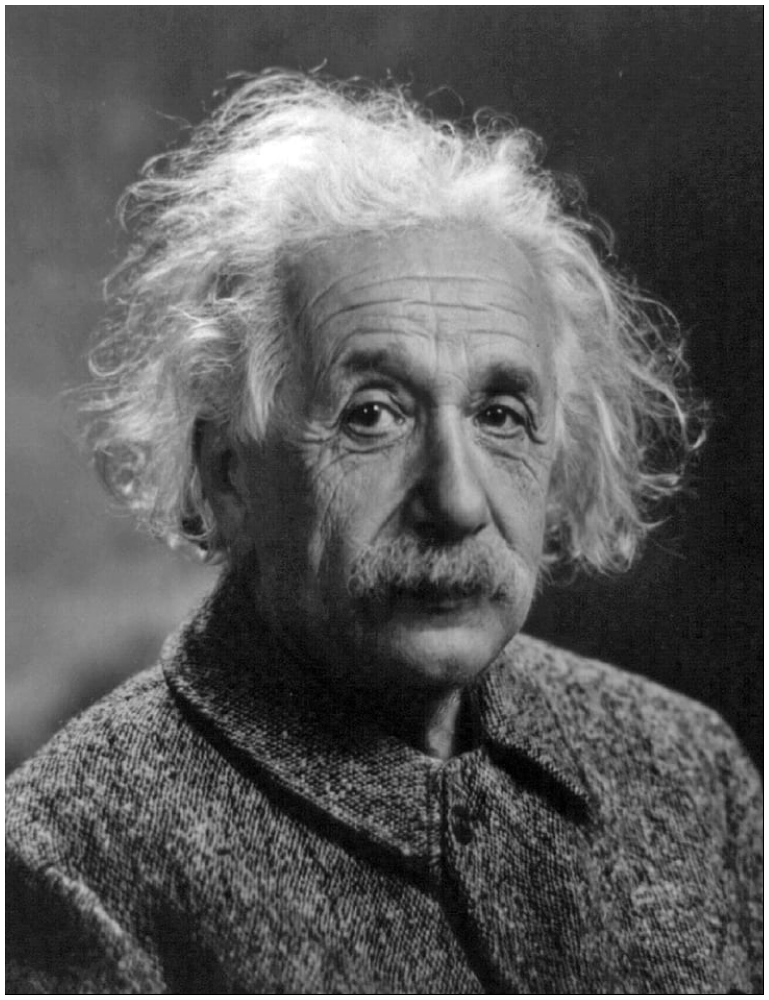

In [45]:

displayImageInActualSize(f_scaleImage([2,2],I_gray))

In [46]:
def displayImageInActualSizeColor(I):
    dpi = mpl.rcParams['figure.dpi']
    H,W = I.shape[0:2]
    figSize = W/float(dpi) , H/float(dpi)
    fig = plt.figure(figsize = figSize)
    ax = fig.add_axes([0,0,1,1])
    ax.axis('off')
    ax.imshow(I,cmap='gray')
    plt.show

In [47]:
I_clr = I_BGR[:,:,::-1]
scale = [2,2]
r = f_scaleImage(scale,I_clr[:,:,0])
g = f_scaleImage(scale,I_clr[:,:,1])
b = f_scaleImage(scale,I_clr[:,:,2])

[[2. 0.]
 [0. 2.]]
[[2. 0.]
 [0. 2.]]
[[2. 0.]
 [0. 2.]]


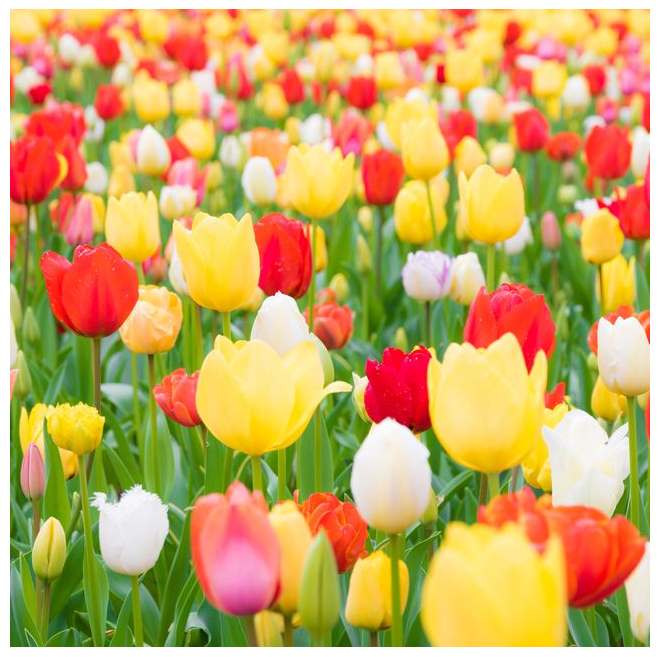

In [48]:
displayImageInActualSizeColor(I_clr)

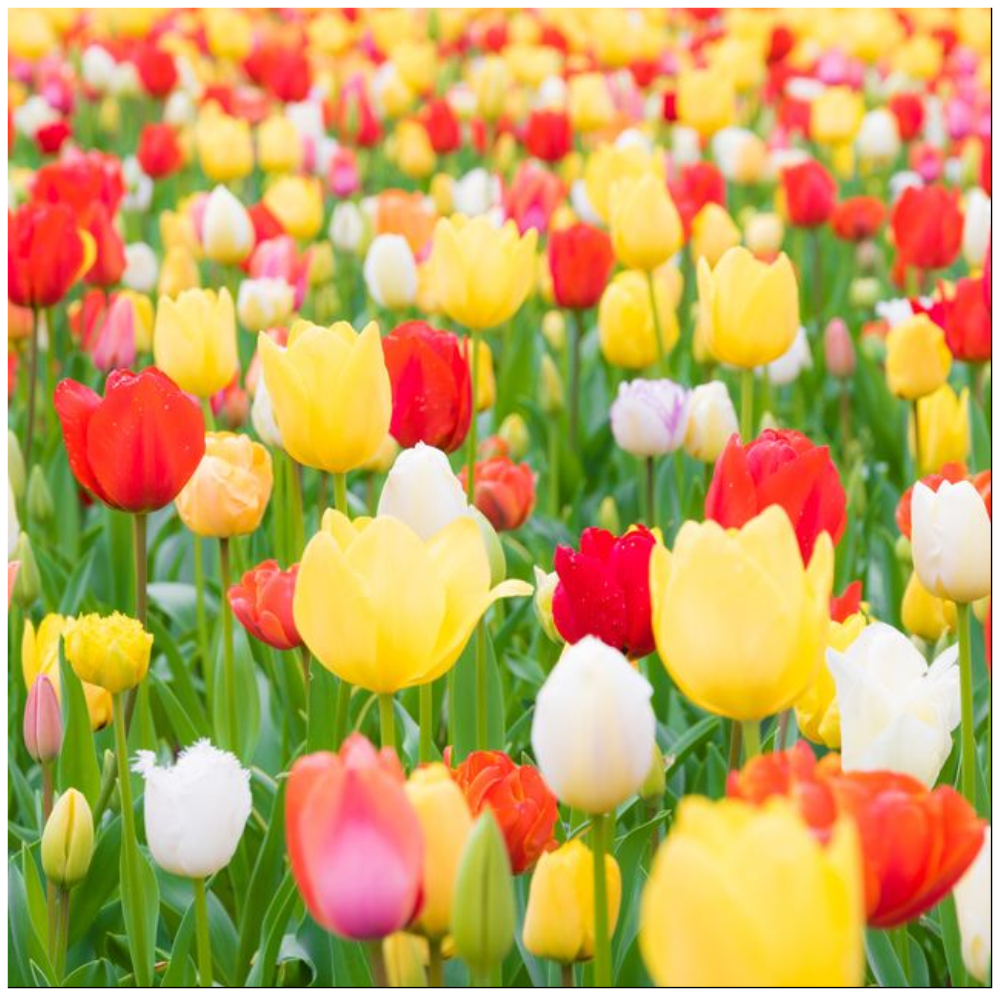

In [49]:
C = np.zeros((r.shape[0],r.shape[1],3),dtype=np.uint8)
C[:,:,0]=r
C[:,:,1]=g
C[:,:,2]=b
displayImageInActualSizeColor(C)

In [50]:
a = 45
ca = np.cos(np.deg2rad(a))
sa = np.sin(np.deg2rad(a))
R = np.array([[ca,-sa],[sa,ca]])
rMax,cMax = I_gray.shape[0],I_gray.shape[1]
Cords = np.array([[0,0],[0,cMax-1],[rMax-1,0],[rMax-1,cMax-1]])
A_dash = R.dot(Cords.T)
mins = A_dash.min(axis=1)
maxs = A_dash.max(axis=1)
minR = np.int64(np.floor(mins[0]))
minC = np.int64(np.floor(mins[1]))
maxR = np.int64(np.ceil(maxs[0]))
maxC = np.int64(np.ceil(maxs[1]))
H,W = maxR-minR+1, maxC-minC+1
I2 = np.zeros((H,W),dtype='uint8')

In [51]:
Tinv = np.linalg.inv(R)
for new_i in range(minR,maxR):
    for new_j in range(minC,maxC):
        P_dash = np.array([new_i,new_j])
        P = Tinv.dot(P_dash)
        i , j = P[0] , P[1]
        if i < 0 or i>=numRows or j<0 or j>=numCols:
            pass
        else:
            g = f_bilinearInterpolate(i,j,I_gray)
            I2[new_i-minR,new_j-minC] = g

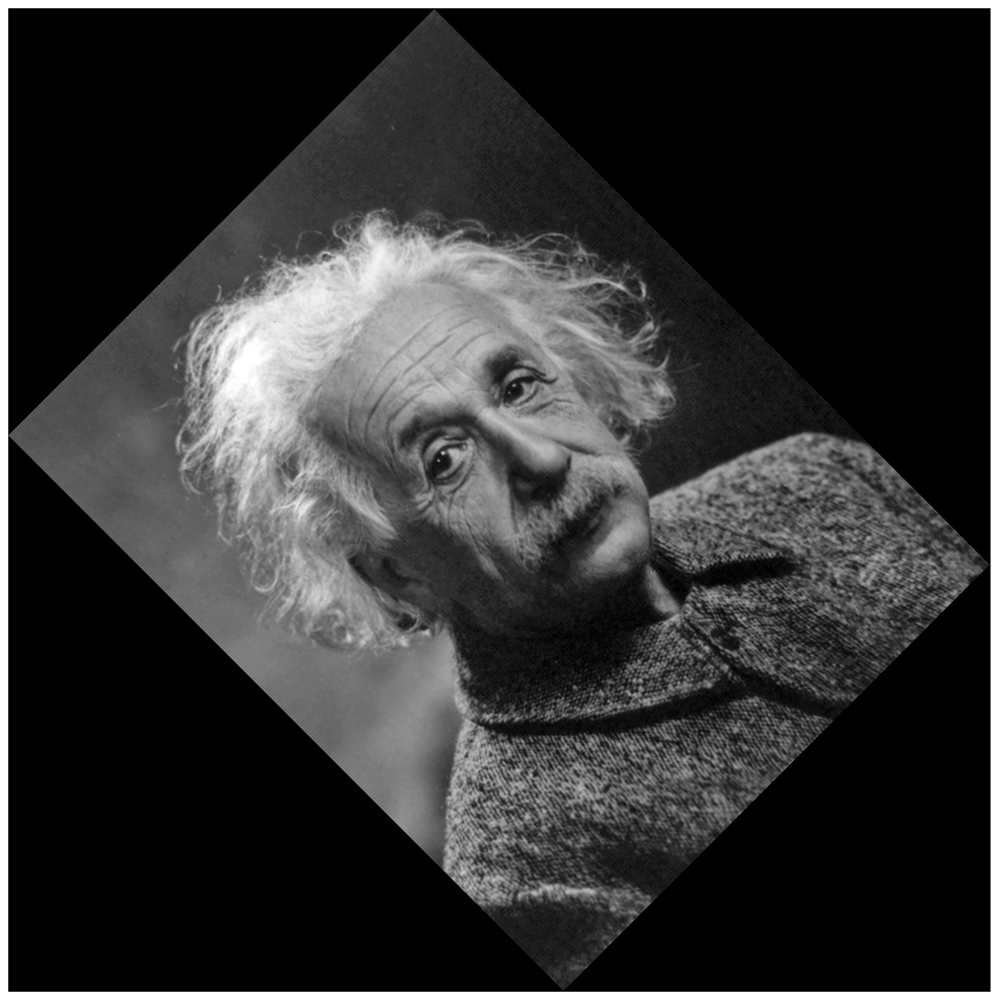

In [52]:
displayImageInActualSize(I2)

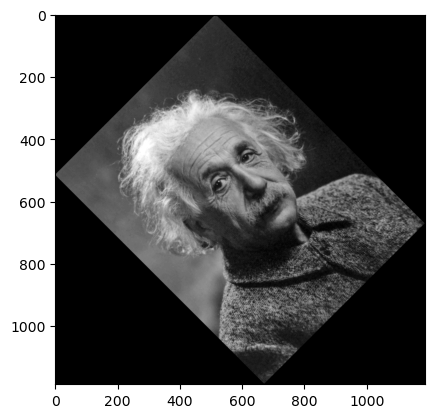

In [53]:
plt.imshow(I2,cmap='gray')

In [54]:
def f_getExtents(T,rMax,cMax):
    Cords = np.array([[0,0],[0,cMax-1],[rMax-1,0],[rMax-1,cMax-1]])
    A_dash = T.dot(Cords.T)
    mins = A_dash.min(axis=1)
    maxs = A_dash.max(axis=1)
    minR = np.int64(np.floor(mins[0]))
    minC = np.int64(np.floor(mins[1]))
    maxR = np.int64(np.ceil(maxs[0]))
    maxC = np.int64(np.ceil(maxs[1]))
    H,W = maxR-minR+1, maxC-minC+1
    return minR,minC,maxR,maxC,H,W

In [55]:
def f_transform(T,I_gray):
    rMax,cMax = I_gray.shape[0],I_gray.shape[1]
    minR,minC,maxR,maxC,H,W = f_getExtents(T,rMax,cMax)
    I2 = np.zeros((H,W),dtype='uint8')
    Tinv = np.linalg.inv(T)
    for new_i in range(minR,maxR):
        for new_j in range(minC,maxC):
            P_dash = np.array([new_i,new_j])
            P = Tinv.dot(P_dash)
            i , j = P[0] , P[1]
            if i < 0 or i>=numRows or j<0 or j>=numCols:
                pass
            else:
                g = f_bilinearInterpolate(i,j,I_gray)
                I2[new_i-minR,new_j-minC] = g
    return I2

In [56]:
I2 = f_transform(T,I_gray)

NameError: name 'T' is not defined

In [ ]:
plt.imshow(I2,cmap='gray')

In [ ]:
T = np.array([[-1,0],[0,1]])

In [ ]:
T

In [ ]:
I2 = f_transform(T,I_gray)

In [ ]:
plt.imshow(I2,cmap='gray')

In [ ]:
T = np.array([[1,0],[0,-1]])
I2 = f_transform(T,I_gray)
plt.imshow(I2,cmap='gray')

In [ ]:
plt.imshow(I_gray,cmap='gray')

In [ ]:
k = 0.2
T = np.array([[1,k],[0,1]])
I2 = f_transform(T,I_gray)
plt.imshow(I2,cmap='gray')

In [61]:
def f_getExtentsAffine(T,rMax,cMax):
    Cords = np.array([[0,0,1],[0,cMax-1,1],[rMax-1,0,1],[rMax-1,cMax-1,1]])
    A_dash = T.dot(Cords.T)
    mins = A_dash.min(axis=1)
    maxs = A_dash.max(axis=1)
    minR = np.int64(np.floor(mins[0]))
    minC = np.int64(np.floor(mins[1]))
    maxR = np.int64(np.ceil(maxs[0]))
    maxC = np.int64(np.ceil(maxs[1]))
    H,W = maxR-minR+1, maxC-minC+1
    return minR,minC,maxR,maxC,H,W

In [62]:
def f_transformAffine(T,I_gray):
    rMax,cMax = I_gray.shape[0],I_gray.shape[1]
    minR,minC,maxR,maxC,H,W = f_getExtentsAffine(T,rMax,cMax)
    I2 = np.zeros((H,W),dtype='uint8')
    Tinv = np.linalg.inv(T)
    for new_i in range(minR,maxR):
        for new_j in range(minC,maxC):
            P_dash = np.array([new_i,new_j,1])
            P = Tinv.dot(P_dash)
            i , j = P[0] , P[1]
            if i < 0 or i>=numRows or j<0 or j>=numCols:
                pass
            else:
                g = f_bilinearInterpolate(i,j,I_gray)
                I2[new_i-minR,new_j-minC] = g
    return I2

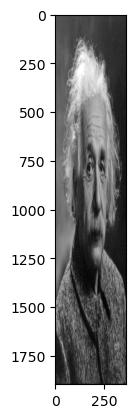

In [63]:
T = np.array([[2,0,10],[0,0.5,20],[0,0,1]])
I2 = f_transformAffine(T,I_gray)
plt.imshow(I2,cmap='gray')

In [64]:
a = 30
ca = np.cos(np.deg2rad(a))
sa = np.sin(np.deg2rad(a))
R = np.array([[ca,-sa,0],[sa,ca,0],[0,0,1]])
T = np.array([[1,0,-300],[0,1,-400],[0,0,1]])
Sh = np.array([[1,0.5,0],[0,1,0],[0,0,1]])
S = np.array([[1.3,0,0],[0,0.7,0],[0,0,1]])
A = np.linalg.inv(T).dot(S).dot(R).dot(Sh).dot(T)

In [65]:
A

array([[  1.12583302,  -0.08708349,  -2.91651246],
       [  0.35      ,   0.78121778, -17.48711306],
       [  0.        ,   0.        ,   1.        ]])

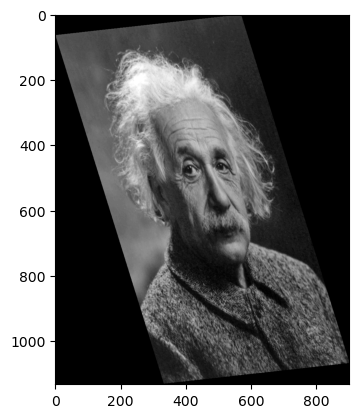

In [66]:
I2 = f_transformAffine(A,I_gray)
plt.imshow(I2,cmap='gray')

In [ ]:
a = 30
ca = np.cos(np.deg2rad(a))
sa = np.sin(np.deg2rad(a))
R = np.array([[ca,-sa],[sa,ca]])

In [ ]:
np.linalg.det(R)

In [ ]:
np.linalg.inv(R)

In [ ]:
R.T

In [ ]:
Rf = R[[1,0],:]

In [ ]:
Rf

In [ ]:
np.linalg.det(Rf)

In [ ]:
Rf.T

In [ ]:
np.linalg.inv(Rf)

In [ ]:
A = np.array([[Rf[0,0],Rf[0,1],0],[Rf[1,0],Rf[1,1],0],[0,0,1]])
I2 = f_transformAffine(A,I_gray)
plt.imshow(I2,cmap='gray')

In [ ]:
def f_getExtentsProjective(T,rMax,cMax):
    Cords = np.array([[0,0,1],[0,cMax-1,1],[rMax-1,0,1],[rMax-1,cMax-1,1]])
    A_dash = T.dot(Cords.T)
    A_dash = A_dash/A_dash[2,:]
    mins = A_dash.min(axis=1)
    maxs = A_dash.max(axis=1)
    minR = np.int64(np.floor(mins[0]))
    minC = np.int64(np.floor(mins[1]))
    maxR = np.int64(np.ceil(maxs[0]))
    maxC = np.int64(np.ceil(maxs[1]))
    H,W = maxR-minR+1, maxC-minC+1
    return minR,minC,maxR,maxC,H,W

In [ ]:
def f_transformProjective(T,I_gray):
    rMax,cMax = I_gray.shape[0],I_gray.shape[1]
    minR,minC,maxR,maxC,H,W = f_getExtentsProjective(T,rMax,cMax)
    I2 = np.zeros((H,W),dtype='uint8')
    Tinv = np.linalg.inv(T)
    for new_i in range(minR,maxR):
        for new_j in range(minC,maxC):
            P_dash = np.array([new_i,new_j,1])
            P = Tinv.dot(P_dash)
            P = P/P[2]
            i , j = P[0] , P[1]
            if i < 0 or i>=numRows or j<0 or j>=numCols:
                pass
            else:
                g = f_bilinearInterpolate(i,j,I_gray)
                I2[new_i-minR,new_j-minC] = g
    return I2

In [ ]:
a = 30
ca = np.cos(np.deg2rad(a))
sa = np.sin(np.deg2rad(a))
R = np.array([[ca,-sa,0],[sa,ca,0],[0,0,1]])
T = np.array([[1,0,-300],[0,1,-400],[0,0,1]])
Sh = np.array([[1,0.5,0],[0,1,0],[0,0,1]])
S = np.array([[1.3,0,0],[0,0.7,0],[0,0,1]])
A = np.linalg.inv(T).dot(S).dot(R).dot(Sh).dot(T)
H = A
H[2,:] = np.array([0.001,0.0001,1])

In [ ]:
H

In [ ]:
I2 = f_transformProjective(H,I_gray)
plt.imshow(I2,cmap='gray')